In [26]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams
import concord as ccd
import time
from pathlib import Path
import seaborn as sns

In [ ]:
proj_name = "concord_1-0-3_0603"
# file_name = "dkd_Wilson"
file_suffix = time.strftime('%b%d-%H%M')

# save_dir = Path(f"../save/{proj_name}-{file_suffix}")
# save_dir.mkdir(parents=True, exist_ok=True)

# data_dir = Path(f"../data/{proj_name}")
# data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

----

### dkd_Wilson

In [5]:
# adata_dkd_final = sc.read_h5ad("../data/dkd_Wilson/dkd_Wilson_final.h5ad")
adata_dkd_final = sc.read_h5ad("../data/concord_1-0-3_0603/dkd_Wilson_final.h5ad")

In [6]:
adata_dkd_final

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'


In [44]:
file_name = "dkd_Wilson"
save_dir = Path(f"../save/{proj_name}-{file_suffix}") / file_name
save_dir.mkdir(parents=True, exist_ok=True)

methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'sample_uuid'
state_key = 'cell_type'

In [45]:
batch_categories = adata_dkd_final.obs[batch_key].unique().tolist()
batch_colors = sns.color_palette("Set1", len(batch_categories))  # "hls", "husl", "nipy_spectral", etc.
batch_pal = {cat: batch_colors[i] for i, cat in enumerate(batch_categories)}

state_categories = adata_dkd_final.obs[state_key].unique().tolist()
state_colors = sns.color_palette("Set1", len(state_categories))  # Adjust if needed
state_pal = {cat: state_colors[i] for i, cat in enumerate(state_categories)}

concord.plotting.pl_embedding - INFO - Plotting unintegrated with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with sample_uuid in UMAP


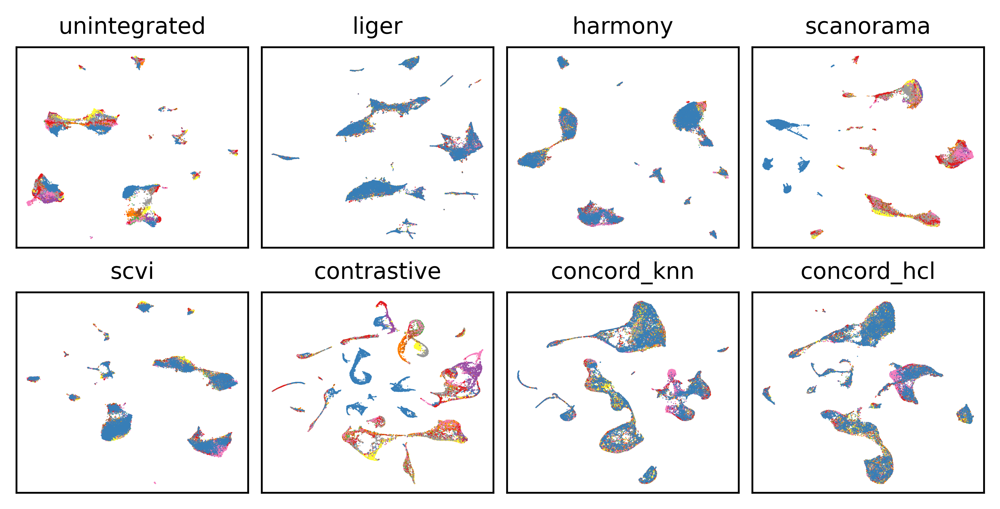

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


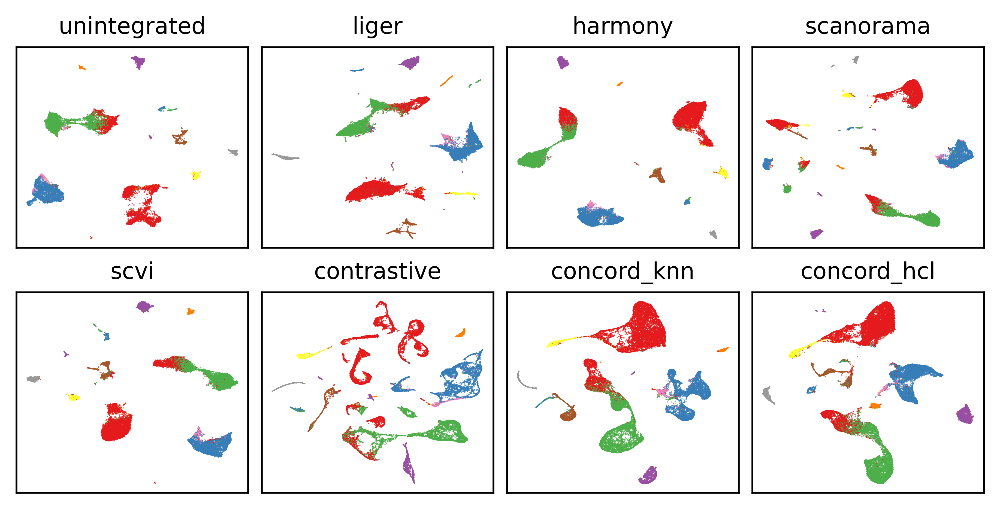

In [46]:
# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=1
alpha=0.8

n_methods = len(show_keys); max_ncols = 4  # to prevent overly wide figures
ncols = min(n_methods, max_ncols)
nrows = int(np.ceil(n_methods / ncols))
figsize = (ncols * 1.5, nrows * 1.5)

pal = {batch_key: batch_pal, 
       state_key: state_pal}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata = adata_dkd_final,
        combined_keys = show_keys,
        color_bys = show_cols,
        basis_types = basis_types,
        pal = pal,
        font_size = font_size,
        point_size = point_size,
        alpha = alpha,
        figsize = figsize,
        ncols = ncols,
        seed = seed,
        save_dir = save_dir,
        file_suffix = file_suffix,
        dpi = 600,
        save_format = 'svg',
    )


----

### cross_tissue_Eraslan

In [21]:
# adata_cross_tissue_final = sc.read_h5ad("../data/cross_tissue_Eraslan/cross_tissue_Eraslan_final.h5ad")
adata_cross_tissue_final = sc.read_h5ad("../data/concord_1-0-3_0603/cross_tissue_Eraslan_final.h5ad")

In [22]:
adata_cross_tissue_final

AnnData object with n_obs × n_vars = 208812 × 32839
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developm

In [37]:
file_name = "cross_tissue_Eraslan"
save_dir = Path(f"../save/{proj_name}-{file_suffix}") / file_name
save_dir.mkdir(parents=True, exist_ok=True)

methods = ["unintegrated", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'batch'
state_key = 'cell_type'

In [38]:
batch_categories = adata_cross_tissue_final.obs[batch_key].unique().tolist()
batch_colors = sns.color_palette("Set1", len(batch_categories))  # "hls", "husl", "nipy_spectral", etc.
batch_pal = {cat: batch_colors[i] for i, cat in enumerate(batch_categories)}

state_categories = adata_cross_tissue_final.obs[state_key].unique().tolist()
state_colors = sns.color_palette("Set1", len(state_categories))  # Adjust if needed
state_pal = {cat: state_colors[i] for i, cat in enumerate(state_categories)}

concord.plotting.pl_embedding - INFO - Plotting unintegrated with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with batch in UMAP


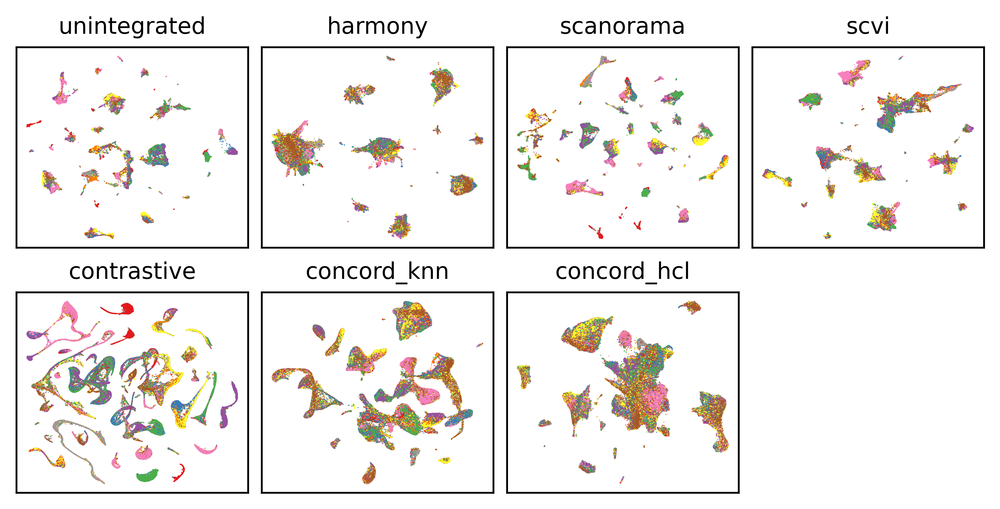

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


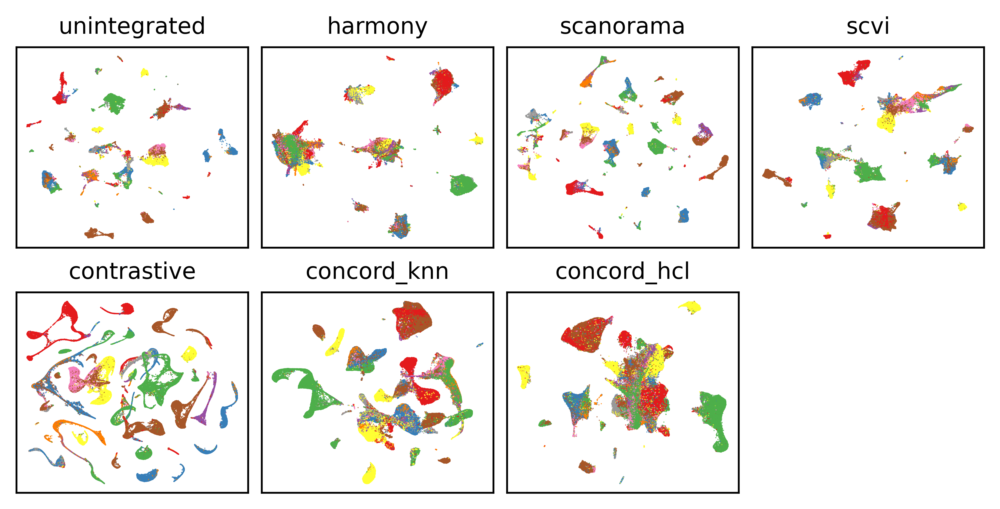

In [ ]:
# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=1
alpha=0.8

n_methods = len(show_keys); max_ncols = 4  # to prevent overly wide figures
ncols = min(n_methods, max_ncols)
nrows = int(np.ceil(n_methods / ncols))
figsize = (ncols * 1.5, nrows * 1.5)

pal = {batch_key: batch_pal, 
       state_key: state_pal}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata = adata_cross_tissue_final,
        combined_keys = show_keys,
        color_bys = show_cols,
        basis_types = basis_types,
        pal = pal,
        font_size = font_size,
        point_size = point_size,
        alpha = alpha,
        figsize = figsize,
        ncols = ncols,
        seed = seed,
        save_dir = save_dir,
        file_suffix = file_suffix,
        dpi = 600,
        save_format = 'svg',
    )


----

### HypoMap_Steuernagel

In [ ]:
# adata_HypoMap_final = sc.read_h5ad("../data/HypoMap_Steuernagel/HypoMap_Steuernagel_final.h5ad")

In [47]:
adata_HypoMap_final = sc.read_h5ad("../data/concord_1-0-3_0603/HypoMap_Steuernagel_final.h5ad")

In [4]:
adata_HypoMap_final

AnnData object with n_obs × n_vars = 384925 × 51676
    obs: 'SRA_ID', 'Sample_ID', 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'Dataset', 'Batch_ID', 'nCount_RNA', 'nFeature_RNA', 'percent_mt', 'C7_named', 'C25_named', 'C66_named', 'C185_named', 'C286_named', 'C465_named', 'Author_Class_Curated', 'Author_CellType', 'Region_summarized', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'feature_name', 'feature_reference', 'feature

In [58]:
# config
file_name = "HypoMap_Steuernagel"
save_dir = Path(f"../save/{proj_name}-{file_suffix}") / file_name
save_dir.mkdir(parents=True, exist_ok=True)

methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'Batch_ID'
state_key = 'cell_type'

# palette setting
batch_categories = adata_HypoMap_final.obs[batch_key].unique().tolist()
batch_colors = sns.color_palette("Set1", len(batch_categories))  # "hls", "husl", "nipy_spectral", etc.
batch_pal = {cat: batch_colors[i] for i, cat in enumerate(batch_categories)}

state_categories = adata_HypoMap_final.obs[state_key].unique().tolist()
state_colors = sns.color_palette("Set1", len(state_categories))  # Adjust if needed
state_pal = {cat: state_colors[i] for i, cat in enumerate(state_categories)}

concord.plotting.pl_embedding - INFO - Plotting unintegrated with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with Batch_ID in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with Batch_ID in UMAP


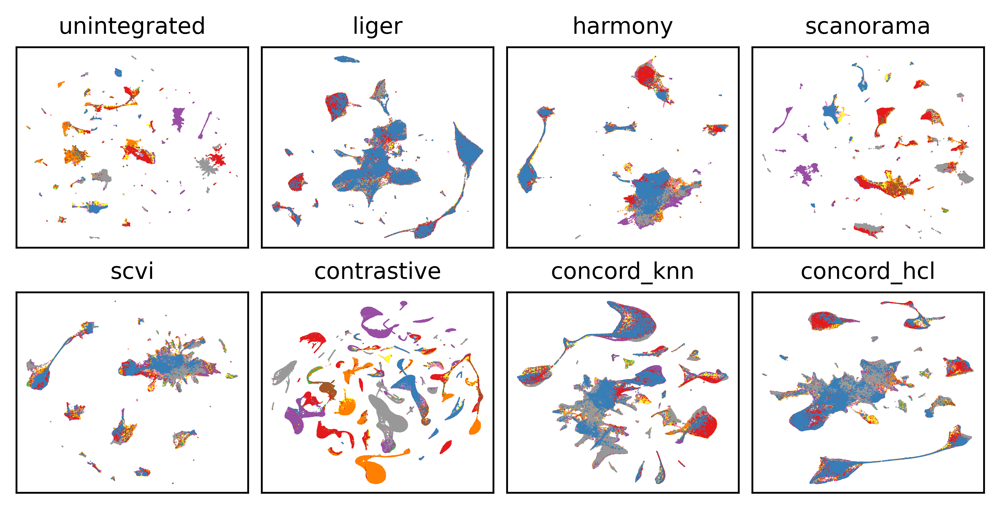

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


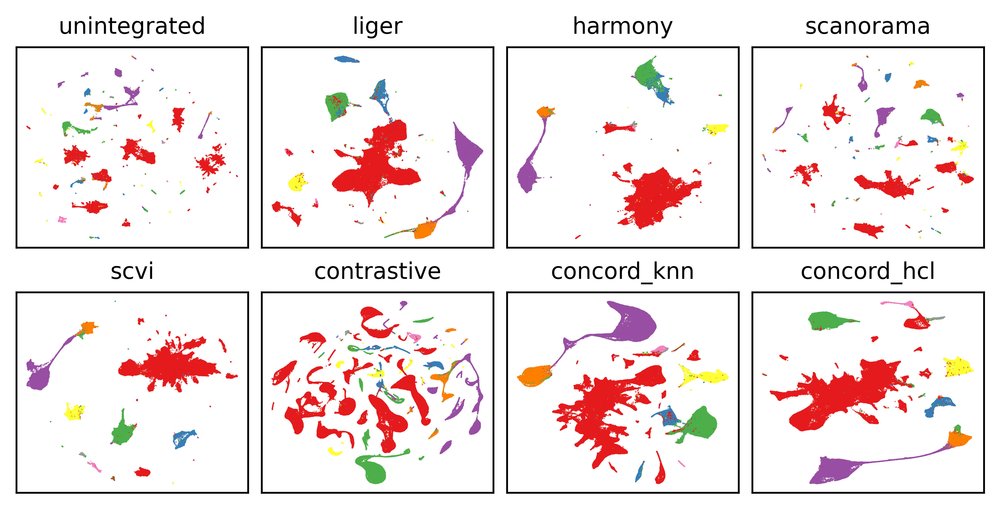

In [59]:
# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=1
alpha=0.8

n_methods = len(show_keys); max_ncols = 4  # to prevent overly wide figures
ncols = min(n_methods, max_ncols)
nrows = int(np.ceil(n_methods / ncols))
figsize = (ncols * 1.5, nrows * 1.5)

pal = {batch_key: batch_pal, 
       state_key: state_pal}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata = adata_HypoMap_final,
        combined_keys = show_keys,
        color_bys = show_cols,
        basis_types = basis_types,
        pal = pal,
        font_size = font_size,
        point_size = point_size,
        alpha = alpha,
        figsize = figsize,
        ncols = ncols,
        seed = seed,
        save_dir = save_dir,
        file_suffix = file_suffix,
        dpi = 600,
        save_format = 'svg',
    )


----

### immune_DominguezConde

In [52]:
# adata_immune_final = sc.read_h5ad("../data/immune_DominguezConde/immune_DominguezConde_final.h5ad")
adata_immune_final = sc.read_h5ad("../data/concord_1-0-3_0603/immune_DominguezConde_final.h5ad")

In [6]:
adata_immune_final

AnnData object with n_obs × n_vars = 329762 × 36398
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch'
    var: 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts'

In [53]:
# config
file_name = "immune_DominguezConde"
save_dir = Path(f"../save/{proj_name}-{file_suffix}") / file_name
save_dir.mkdir(parents=True, exist_ok=True)

methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'batch'
state_key = 'cell_type'

# palette setting
batch_categories = adata_immune_final.obs[batch_key].unique().tolist()
batch_colors = sns.color_palette("Set1", len(batch_categories))  # "hls", "husl", "nipy_spectral", etc.
batch_pal = {cat: batch_colors[i] for i, cat in enumerate(batch_categories)}

state_categories = adata_immune_final.obs[state_key].unique().tolist()
state_colors = sns.color_palette("Set1", len(state_categories))  # Adjust if needed
state_pal = {cat: state_colors[i] for i, cat in enumerate(state_categories)}

concord.plotting.pl_embedding - INFO - Plotting unintegrated with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with batch in UMAP


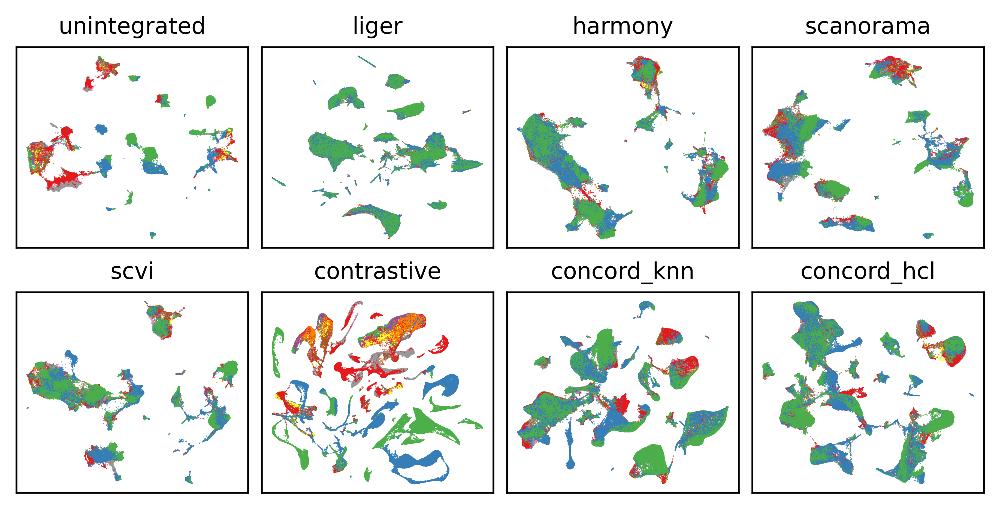

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


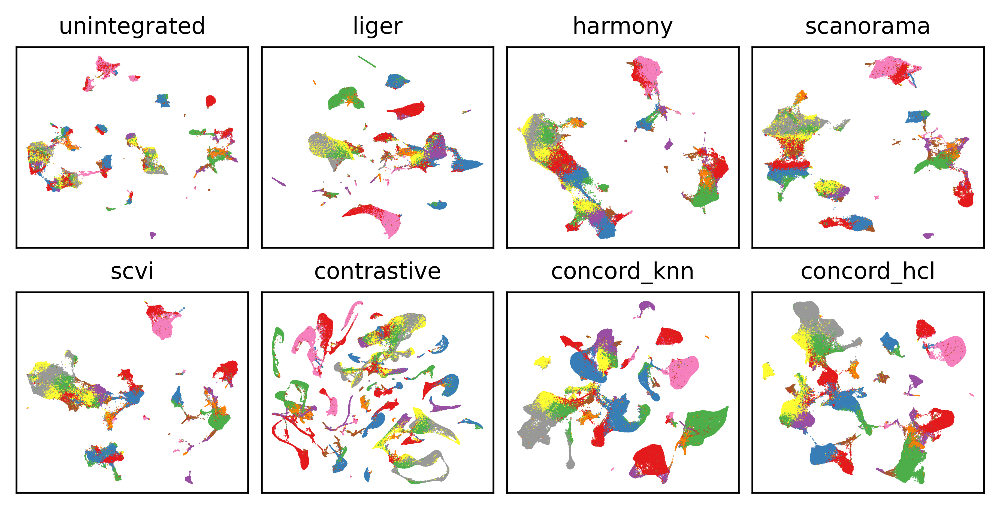

In [54]:
# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=1
alpha=0.8

n_methods = len(show_keys); max_ncols = 4  # to prevent overly wide figures
ncols = min(n_methods, max_ncols)
nrows = int(np.ceil(n_methods / ncols))
figsize = (ncols * 1.5, nrows * 1.5)

pal = {batch_key: batch_pal, 
       state_key: state_pal}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata = adata_immune_final,
        combined_keys = show_keys,
        color_bys = show_cols,
        basis_types = basis_types,
        pal = pal,
        font_size = font_size,
        point_size = point_size,
        alpha = alpha,
        figsize = figsize,
        ncols = ncols,
        seed = seed,
        save_dir = save_dir,
        file_suffix = file_suffix,
        dpi = 600,
        save_format = 'svg',
    )


----

### pancreatic_islet_Hrovatin

In [55]:
# adata_pancreatic_islet_final = sc.read_h5ad("../data/pancreatic_islet_Hrovatin/pancreatic_islet_Hrovatin_final.h5ad")
adata_pancreatic_islet_final = sc.read_h5ad("../data/concord_1-0-3_0603/pancreatic_islet_Hrovatin_final.h5ad")

In [11]:
adata_pancreatic_islet_final

AnnData object with n_obs × n_vars = 301723 × 31202
    obs: 'batch_integration', 'dataset', 'design', 'cell_cycle_phase', 'ins_high', 'gcg_high', 'sst_high', 'ppy_high', 'cell_filtering', 'strain', 'age', 'cell_type_originalDataset_unified', 'cell_type_originalDataset', 'cell_type_reannotatedIntegrated', 'n_genes', 'mt_frac', 'doublet_score', 'log10_n_counts', 'age_approxDays', 'dataset__design__sample', 'cell_subtype_immune_reannotatedIntegrated', 'cell_subtype_endothelial_reannotatedIntegrated', 'emptyDrops_LogProb_scaled', 'cell_subtype_beta_coarse_reannotatedIntegrated', 'cell_subtype_beta_fine_reannotatedIntegrated', 'GP_1', 'GP_2', 'GP_3', 'GP_4', 'GP_5', 'GP_6', 'GP_7', 'GP_8', 'GP_9', 'GP_10', 'GP_11', 'GP_12', 'GP_13', 'GP_14', 'GP_15', 'GP_16', 'GP_17', 'GP_18', 'GP_19', 'GP_20', 'GP_21', 'GP_22', 'GP_23', 'GP_24', 'GP_25', 'GP_26', 'GP_27', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'diabetes_model', 'chemical_stress', 'GEO

In [56]:
# config
file_name = "pancreatic_islet_Hrovatin"
save_dir = Path(f"../save/{proj_name}-{file_suffix}") / file_name
save_dir.mkdir(parents=True, exist_ok=True)

methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'batch_integration'
state_key = 'cell_type'

# palette setting
batch_categories = adata_pancreatic_islet_final.obs[batch_key].unique().tolist()
batch_colors = sns.color_palette("Set1", len(batch_categories))  # "hls", "husl", "nipy_spectral", etc.
batch_pal = {cat: batch_colors[i] for i, cat in enumerate(batch_categories)}

state_categories = adata_pancreatic_islet_final.obs[state_key].unique().tolist()
state_colors = sns.color_palette("Set1", len(state_categories))  # Adjust if needed
state_pal = {cat: state_colors[i] for i, cat in enumerate(state_categories)}

concord.plotting.pl_embedding - INFO - Plotting unintegrated with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with batch_integration in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with batch_integration in UMAP


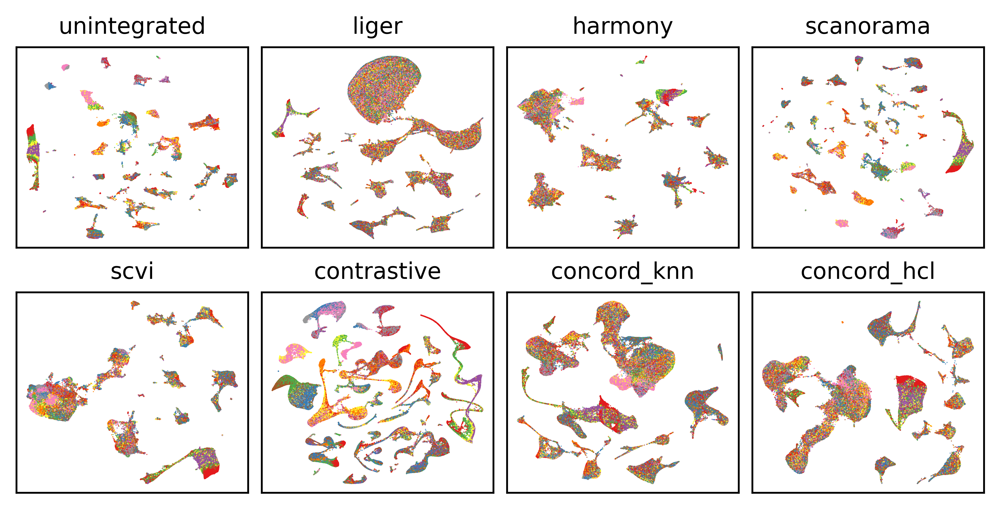

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


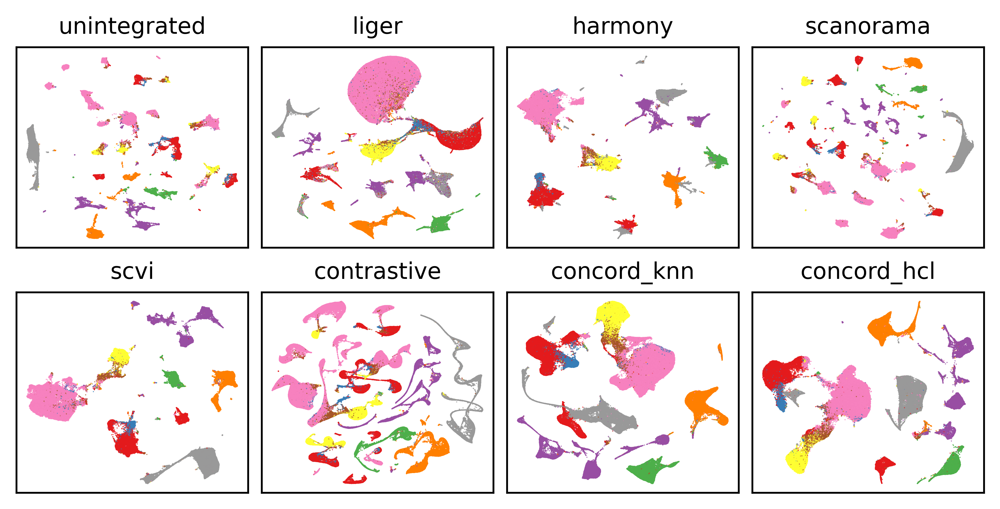

In [57]:
# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=1
alpha=0.8

n_methods = len(show_keys); max_ncols = 4  # to prevent overly wide figures
ncols = min(n_methods, max_ncols)
nrows = int(np.ceil(n_methods / ncols))
figsize = (ncols * 1.5, nrows * 1.5)

pal = {batch_key: batch_pal, 
       state_key: state_pal}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata = adata_pancreatic_islet_final,
        combined_keys = show_keys,
        color_bys = show_cols,
        basis_types = basis_types,
        pal = pal,
        font_size = font_size,
        point_size = point_size,
        alpha = alpha,
        figsize = figsize,
        ncols = ncols,
        seed = seed,
        save_dir = save_dir,
        file_suffix = file_suffix,
        dpi = 600,
        save_format = 'svg',
    )
